In [1]:
import scanpy as sc
from harmony import harmonize
import pandas as pd
import seaborn as sns
import numpy as np
import pegasus as pg

In [22]:
ss2 = sc.read_h5ad("210318_ss2_2_af_cc_gt.h5ad")
m10x = sc.read_h5ad('../lhsc_10x_3rd.GRCh38-rna_af_cellcyc.h5ad')

In [23]:
ss2.obs['tech']='ss2'

In [26]:
m10x.obs['tech'] = '10x'

In [28]:
m10x.obs['sample_type']=m10x.obs.Channel

In [29]:
m10x.obs['louvain']=m10x.obs.louvain_labels

In [32]:
m10x.obs['batch']=m10x.obs.Channel

In [35]:
adata= m10x.concatenate(ss2,
    batch_key="dataset",
    batch_categories=['ss2', '10x'])


In [38]:
adata.obs['donor']=adata.obs.batch

In [39]:
adata.obs.donor.replace({"AAVS1_11K":"B","MECOM_16K":'B'},inplace=True)

In [40]:
adata.obs.donor.replace({"AAVS912_1":"A","MR912_3":'A',"AAVS912_2":"A","MR912_5":'A',"MR912_2":'A'},inplace=True)

In [41]:
adata.obs.donor.replace({"AAVS214_3":"C","MR214_1":'C',"MR214_2":"C"},inplace=True)

In [1]:
# adata.write('210317_10x_ss2.h5ad')


In [99]:
adata.obsm['X_harmony'] = harmonize(np.array(adata.obsm['X_pca']), adata.obs, batch_key = ['batch','tech','donor'])


	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).


In [100]:
# adata.write('210317_10x_ss2_combine_harmonize.h5ad')

In [2]:

data=pg.read_input('210317_10x_ss2_combine_harmonize.h5ad')



In [6]:
data.uns['genome']='GRCh38'

In [7]:
data.uns['modality']='rna'

In [8]:
pg.qc_metrics(data, min_genes=500, max_genes=30000,percent_mito=20)

In [10]:
data.obs['sample_type'].value_counts()

MECOM_16K    5935
AAVS1_11K    4291
mecom         251
aavs          224
Name: sample_type, dtype: int64

In [11]:
data.obs['tech'].value_counts()

10x    10226
ss2      475
Name: tech, dtype: int64

In [13]:
pg.identify_robust_genes(data)

2021-04-21 15:21:05,304 - pegasus.tools.preprocessing - INFO - After filtration, 15491/15491 genes are kept. Among 15491 genes, 15491 genes are robust.


In [14]:
pg.highly_variable_features(data, consider_batch=True)

2021-04-21 15:21:15,939 - pegasus.tools.hvf_selection - INFO - Estimation on feature statistics per channel is finished. Time spent = 7.72s.
2021-04-21 15:21:16,023 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2021-04-21 15:21:16,024 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 7.80s.


In [15]:
pg.neighbors(data)

2021-04-21 15:21:17,861 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 1.83s.
2021-04-21 15:21:18,258 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 0.40s.


In [16]:
pg.pca(data, robust=True)


2021-04-21 15:21:23,175 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 4.91s.


In [17]:
pg.umap(data)

2021-04-21 15:21:23,198 - pegasus.tools.visualization - INFO - UMAP(min_dist=0.5, random_state=0, verbose=True)
2021-04-21 15:21:23,199 - pegasus.tools.visualization - INFO - Construct fuzzy simplicial set
2021-04-21 15:21:25,778 - pegasus.tools.visualization - INFO - Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
2021-04-21 15:21:33,236 - pegasus.tools.visualization - INFO - UMAP is calculated. Time spent = 10.05s.
2021-04-21 15:21:33,237 - pegasus.tools.visualization - INFO - Function 'umap' finished in 10.06s.


In [19]:
# pg.highly_variable_features(data, consider_batch=True)
pg.pca(data, robust=True)
# pca_key = pg.run_harmony(data)
pca_key = pg.run_scanorama(data, random_state = 25)

2021-04-21 15:21:40,268 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 5.62s.
2021-04-21 15:21:40,292 - pegasus.tools.batch_correction - INFO - Start integration using Scanorama.
Found 2000 genes among all datasets
[[0.         0.97692845 0.80631579]
 [0.         0.         1.        ]
 [0.         0.         0.        ]]
Processing datasets (1, 2)
Processing datasets (0, 1)
Processing datasets (0, 2)
2021-04-21 15:21:52,523 - pegasus.tools.batch_correction - INFO - Function 'run_scanorama' finished in 12.25s.


In [20]:
pg.neighbors(data, rep=pca_key)
pg.louvain(data, rep=pca_key)

2021-04-21 15:21:55,173 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 2.64s.
2021-04-21 15:21:55,656 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 0.48s.
2021-04-21 15:21:56,205 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 0.55s.
2021-04-21 15:22:05,054 - pegasus.tools.clustering - INFO - Louvain clustering is done. Get 7 clusters.
2021-04-21 15:22:05,123 - pegasus.tools.clustering - INFO - Function 'louvain' finished in 9.47s.


In [27]:
pg.umap(data, rep=pca_key )

2021-04-13 12:59:36,765 - pegasus.tools.visualization - INFO - UMAP(min_dist=0.5, random_state=0, verbose=True)
2021-04-13 12:59:36,766 - pegasus.tools.visualization - INFO - Construct fuzzy simplicial set
2021-04-13 12:59:36,845 - pegasus.tools.visualization - INFO - Construct embedding
	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
2021-04-13 12:59:43,861 - pegasus.tools.visualization - INFO - UMAP is calculated. Time spent = 7.10s.
2021-04-13 12:59:43,862 - pegasus.tools.visualization - INFO - Function 'umap' finished in 7.11s.


In [28]:
# pg.write_output(data,'210413_10x_ss2_rv3_harmony_run_scanorama_adata_umap.h5ad')


... storing 'Group' as categorical


2021-04-13 13:02:02,800 - pegasusio.readwrite - INFO - h5ad file '210413_10x_ss2_rv3_harmony_run_scanorama_adata_umap.h5ad' is written.
2021-04-13 13:02:02,801 - pegasusio.readwrite - INFO - Function 'write_output' finished in 56.46s.


In [26]:
data=pg.read_input('210413_10x_ss2_rv3_harmony_run_scanorama_adata_umap.h5ad')

2021-04-21 15:25:04,940 - pegasusio.readwrite - INFO - h5ad file '210413_10x_ss2_rv3_harmony_run_scanorama_adata_umap.h5ad' is loaded.
2021-04-21 15:25:04,941 - pegasusio.readwrite - INFO - Function 'read_input' finished in 9.30s.


In [27]:
pg.louvain(data, resolution=0.5, rep=pca_key )

2021-04-21 15:25:12,299 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 0.54s.
2021-04-21 15:25:16,750 - pegasus.tools.clustering - INFO - Louvain clustering is done. Get 2 clusters.
2021-04-21 15:25:16,815 - pegasus.tools.clustering - INFO - Function 'louvain' finished in 5.05s.


In [29]:
pg.write_output(data,'210421_10x_ss2_rv3_harmony_run_scanorama_adata_umap_louvain_0.5.h5ad')


2021-04-21 15:26:50,614 - pegasusio.readwrite - INFO - h5ad file '210421_10x_ss2_rv3_harmony_run_scanorama_adata_umap_louvain_0.5.h5ad' is written.
2021-04-21 15:26:50,614 - pegasusio.readwrite - INFO - Function 'write_output' finished in 63.32s.


Let's check the composition plot now:

In [23]:
data.obs['louvain_labels'].value_counts()

1    6010
2    4691
Name: louvain_labels, dtype: int64

If everything goes properly, you should be able to see that no cluster has a dominant donor cells. Also notice that Louvain algorithm on the corrected data finds 16 clusters, instead of the original 18 ones.

Also, FIt-SNE plot is different:

You can see that the right-hand-side plot has a much better mixture of cells from different donors.

## Visualization

In [33]:
# unify sample type 
data.obs.sample_type.replace({"AAVS1_11K":"aavs","MECOM_16K":'mecom'},inplace=True)

In [34]:
data.obs.sample_type.replace({"aavs":"AAVS",'mecom':'MECOM'},inplace=True)

In [3]:
pg.scatter(data, attrs=['sample_type'],palettes='black,red', basis='umap', alpha=0.5, ppi=3000)

In [36]:
data_ss2=data[data.obs.tech=='ss2'].copy()

In [4]:
pg.scatter(data, 'tech', palettes='lightgrey,red', basis='umap', alpha=1)

In [ ]:
pg.scatter(data, attrs=['louvain_labels', 'sample_type','genotype','tech'], basis='umap')

# ratio of two conditions


In [5]:
pg.scatter(data, attrs=['louvain_labels'], basis='umap')

# genotyping

In [147]:
data.obs.genotype.replace({"na":"nodata","nan":'nodata'},inplace=True)


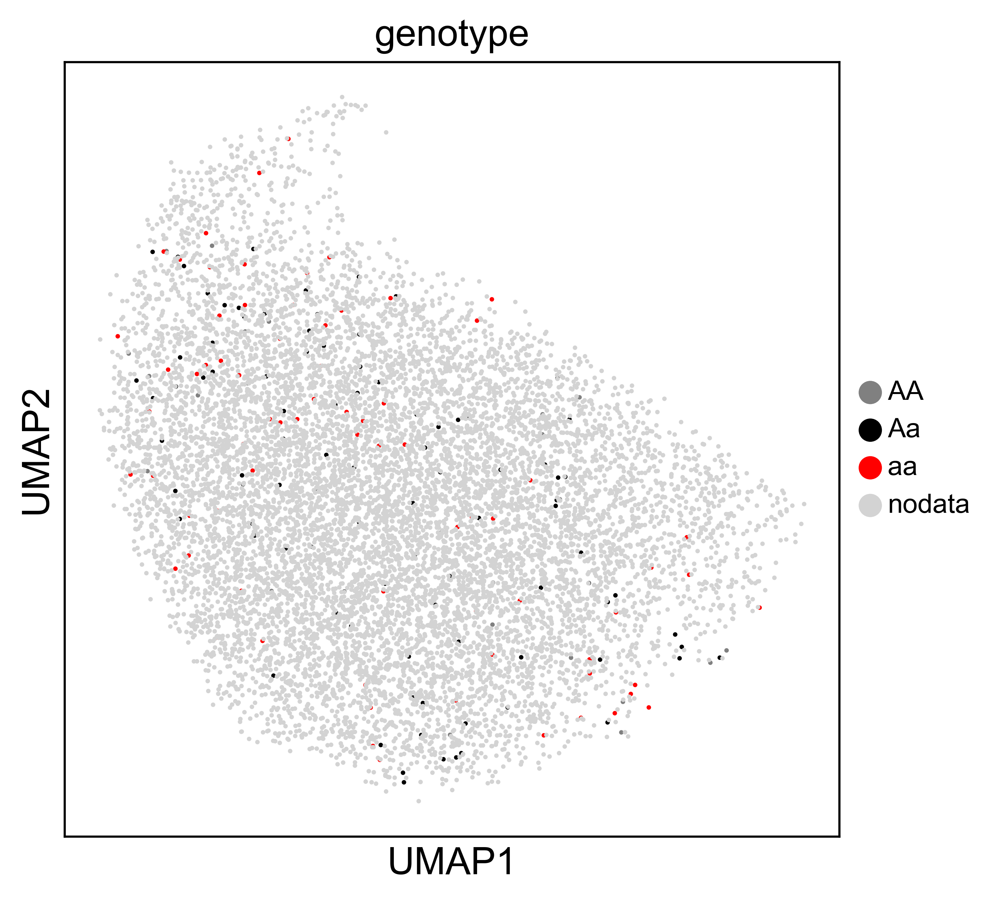

In [149]:
pg.scatter(data, attrs=['genotype'],palettes='grey,black,red,lightgrey',basis='umap')
# pg.scatter(data, attrs=['genotype'],basis='umap')

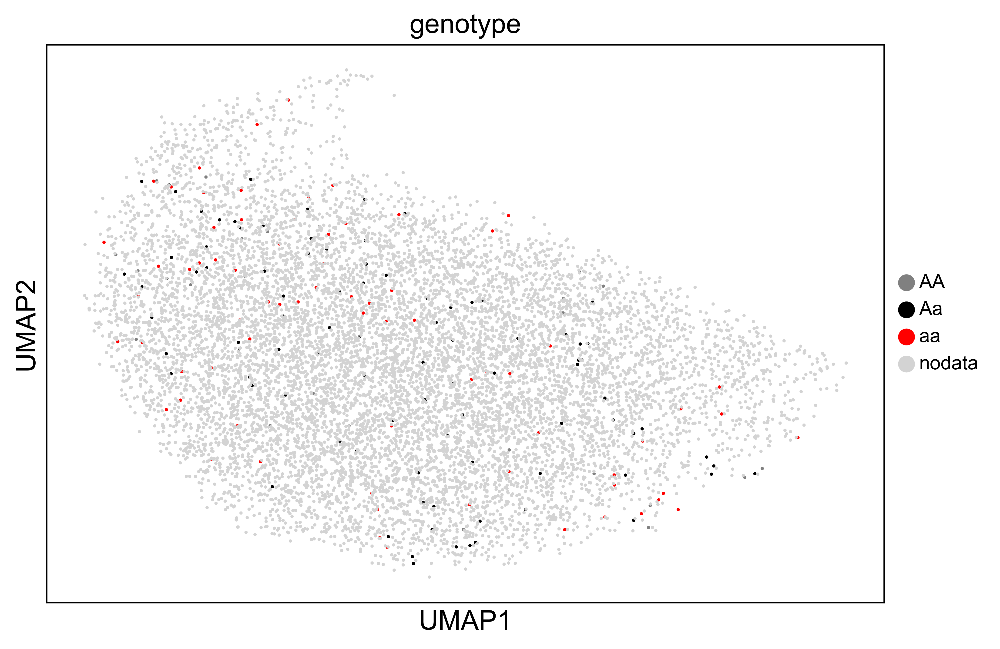

In [91]:
# pg.scatter(data, panel_size=[6,4], attrs=['genotype'],palettes='grey,black,red,lightgrey',basis='umap',ppi=600)

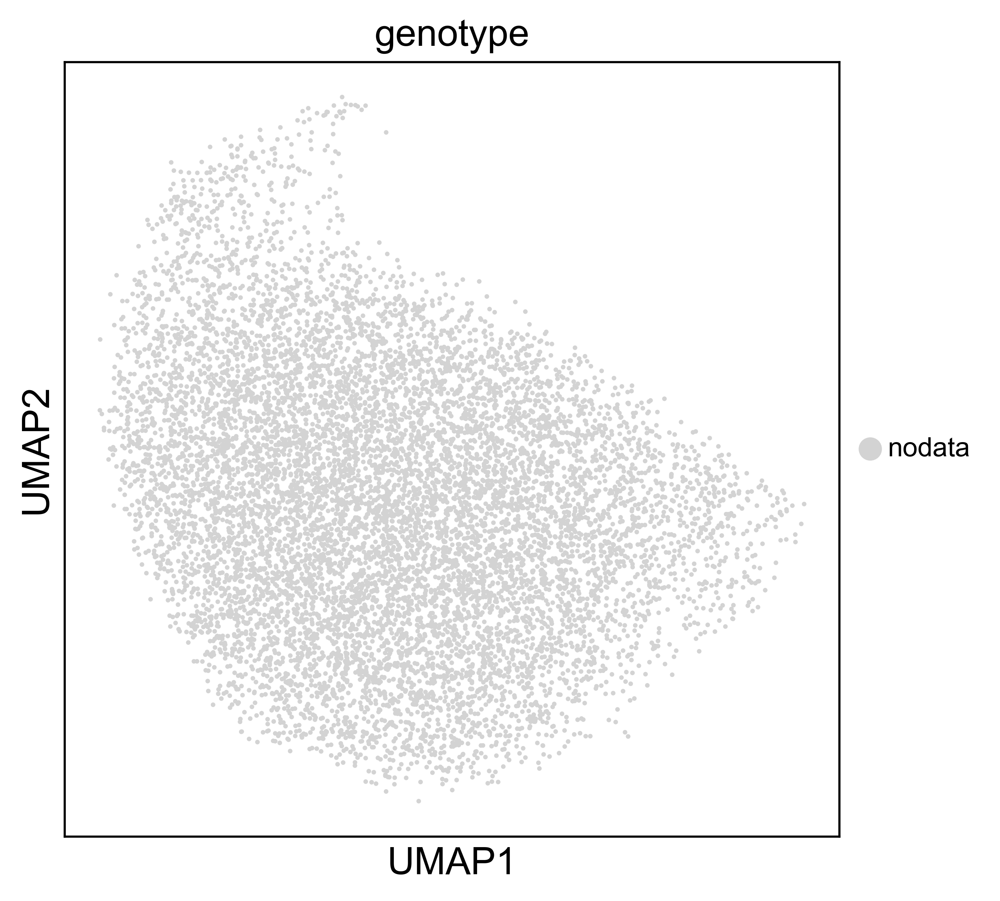

In [179]:
# pg.scatter(data_10x,  'genotype_rv3',palettes='lightgrey',panel_size=[6,4], basis='umap')
pg.scatter(data_10x,  'genotype',palettes='lightgrey',basis='umap', ppi=3000)

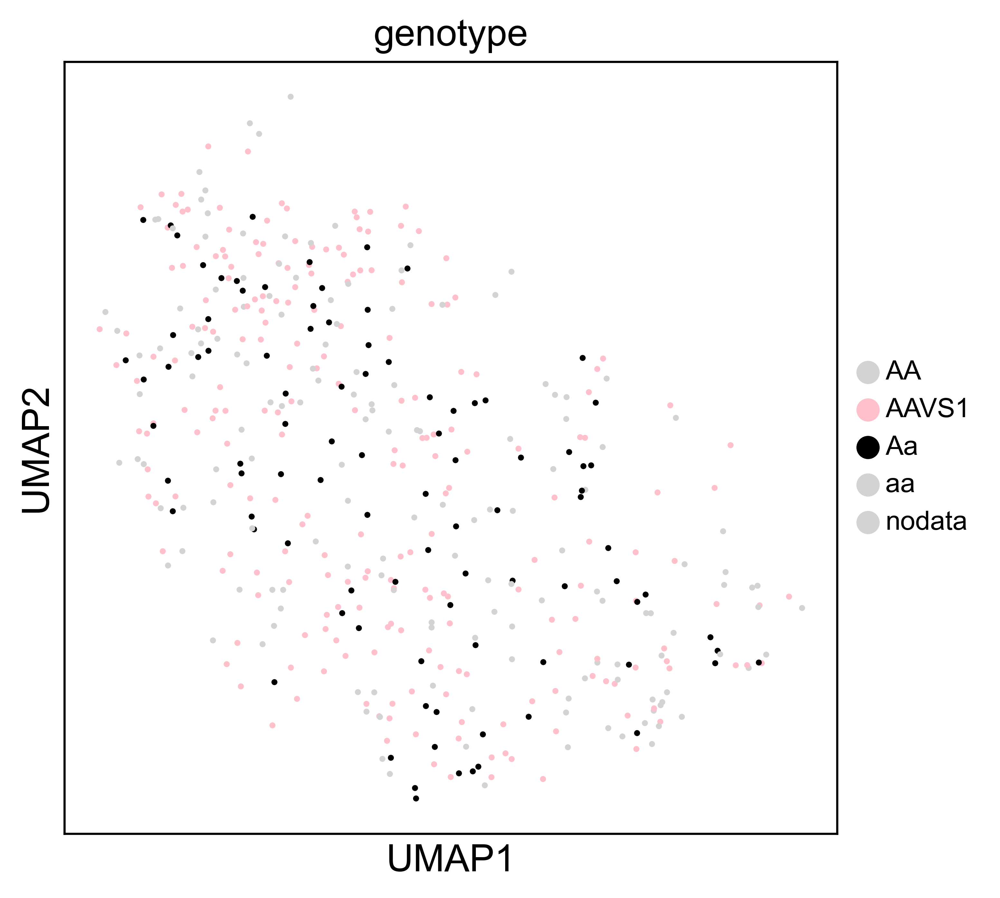

In [172]:
# pg.scatter(data_ss2,panel_size=[3,2], attrs=['genotype_rv3'],palettes='pink,black,red,lightgrey',basis='umap')
pg.scatter(data_ss2, attrs=['genotype'],palettes='lightgrey,pink,black,lightgrey,lightgrey',basis='umap', ppi=3000)

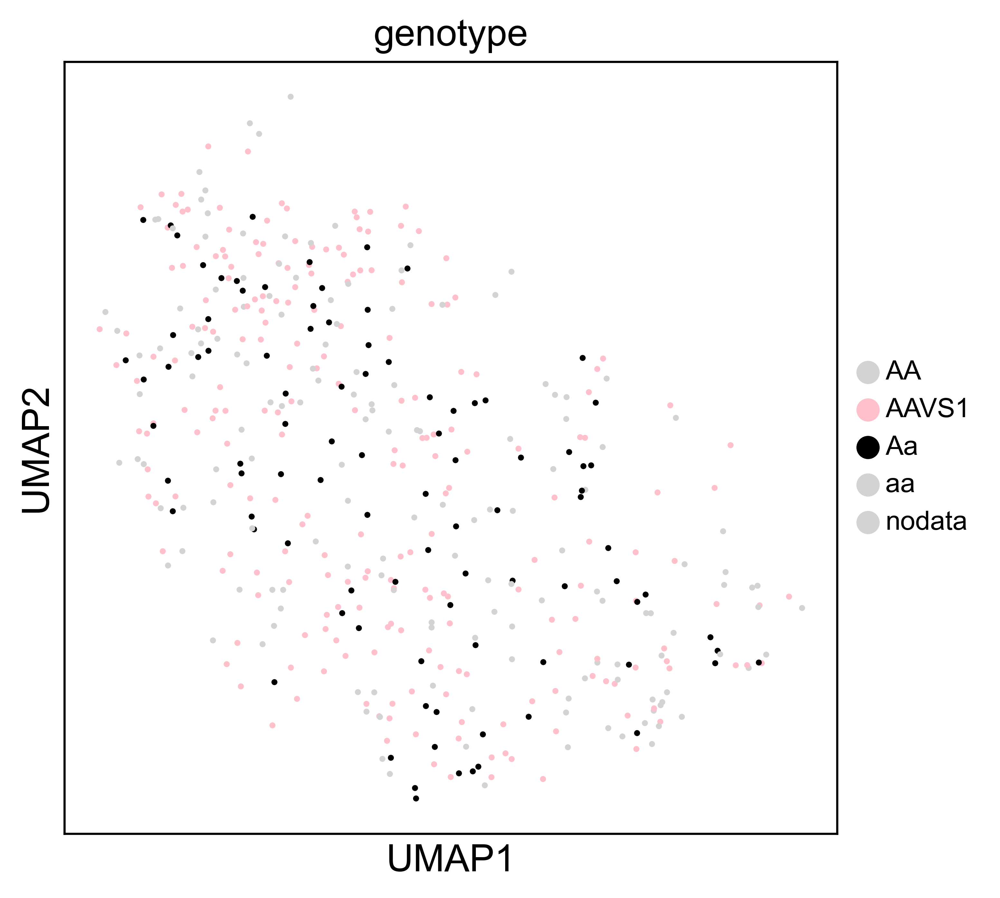

In [174]:
# data_ss2.obs['genotype'][data_ss2.obs.sample_type=='AAVS']="AAVS1"

pg.scatter(data_ss2, attrs=['genotype'],palettes='lightgrey,pink,black,lightgrey,lightgrey',basis='umap')

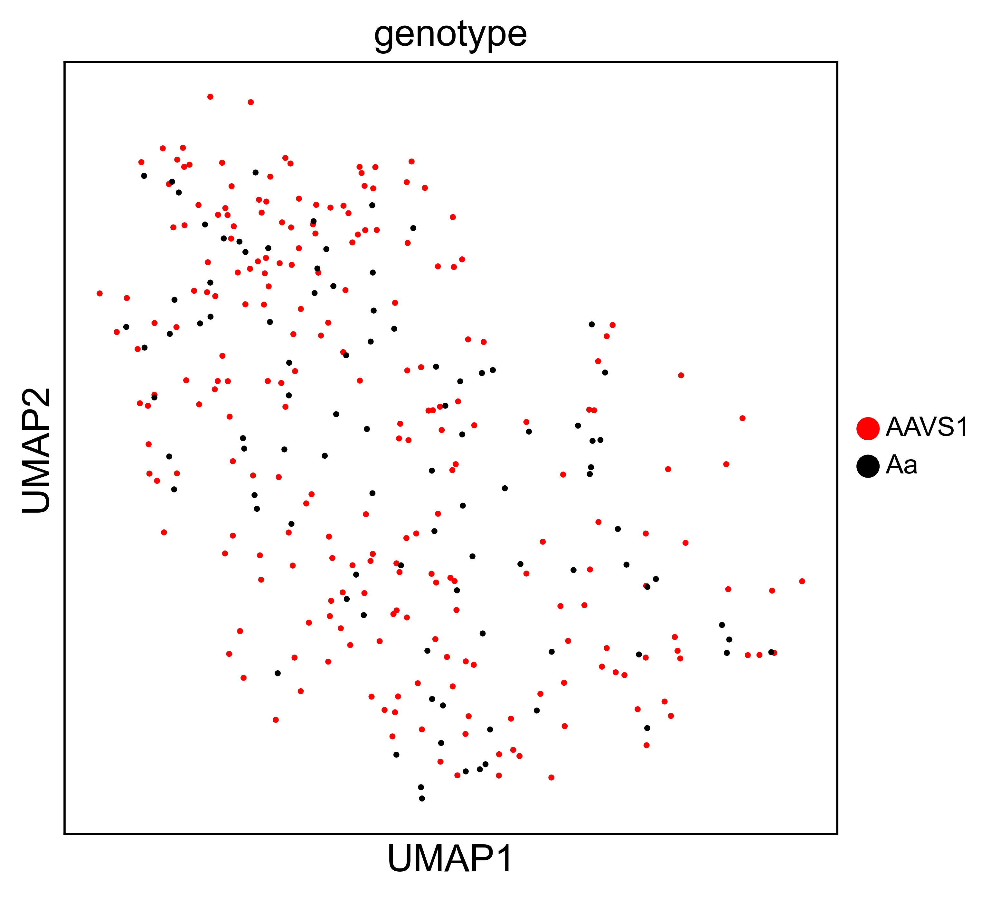

In [178]:

pg.scatter(data_ss2_Aa_AAVS, attrs=['genotype'],palettes='red,black',basis='umap',ppi=3000)

In [175]:
data_ss2_Aa_AAVS=data_ss2[data_ss2.obs.genotype.isin(['AAVS1','Aa'])].copy()


In [166]:
data_ss2.obs.genotype.value_counts()

AAVS1     224
Aa         95
aa         73
nodata     61
AA         22
Name: genotype, dtype: int64

# genes of interests



In [ ]:
genes_vijay=["MLLT3","CSF2RB","CRHBP", "HLF", "DUSP","SOCS2", "HOPX", "CDKN1A", "HIST1H1C",'ALDH2','RUSAT','RBPMS',"HOXA9",'MGMT','HEMGN','MSI2']
genes_vijay_pick=list()
for i in genes_vijay:
    if i in ss2_all:
        genes_vijay_pick.append(i)
genes_vijay_pick

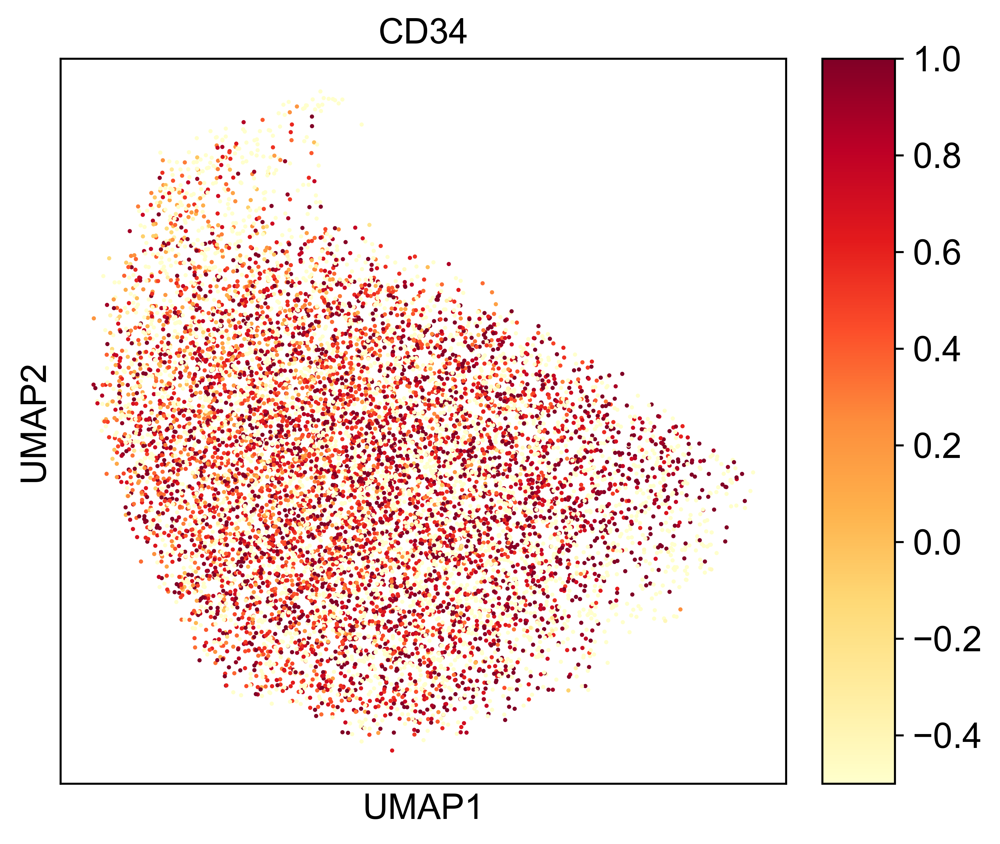

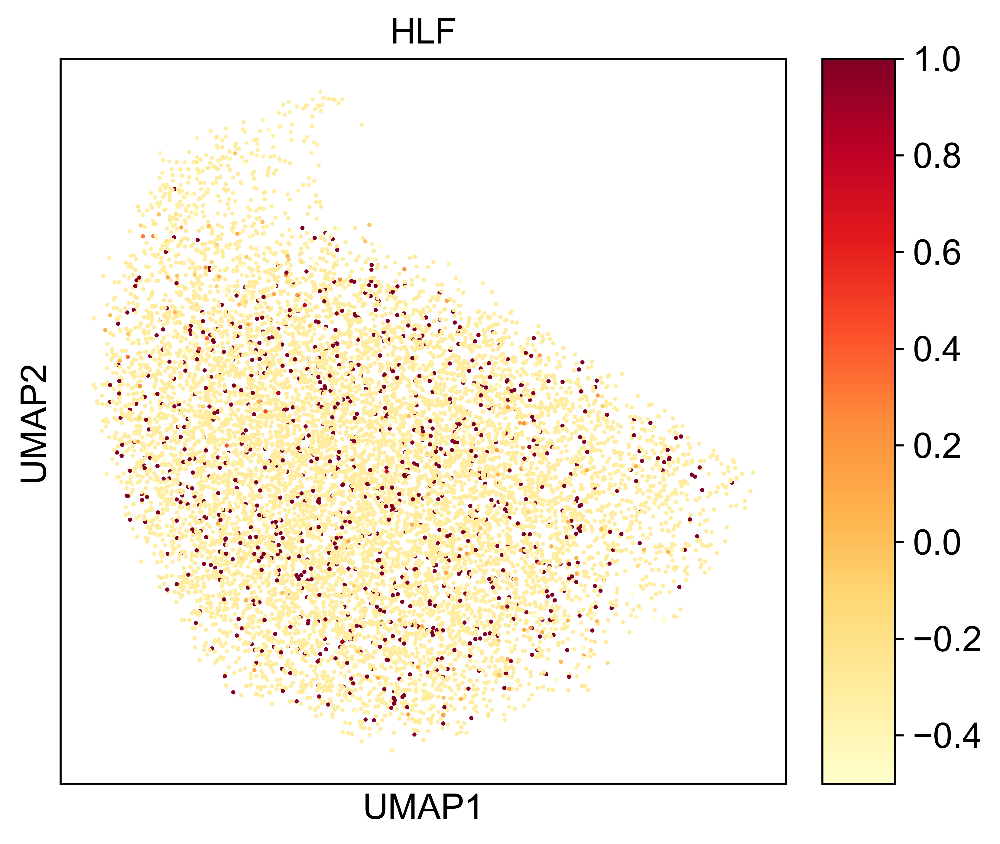

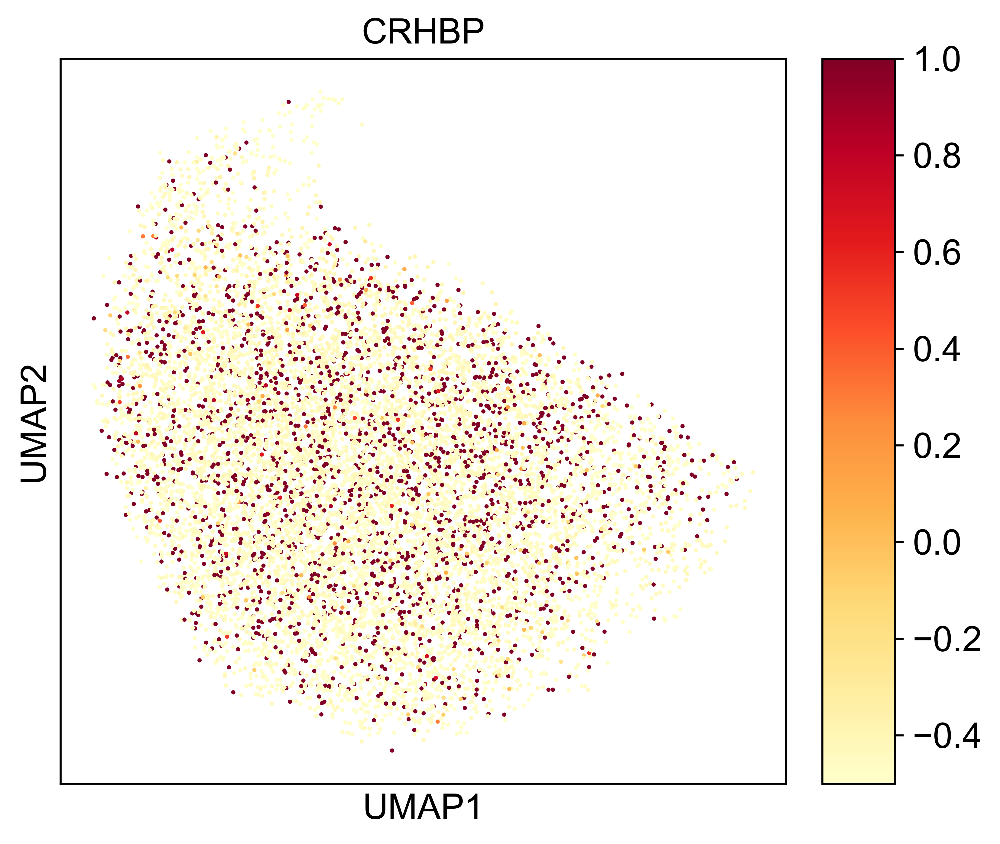

In [62]:
for gene in ['CD34','HLF', 'CRHBP']:
    pg.scatter(data, gene ,cmaps='YlOrRd', vmin=-0.5, vmax=1 ,alpha=1)


# lt_hsc_sig sig


In [133]:
# pg.calc_signature_score(data, {"lt_hsc_sig": ["CD34", "HLF", "CRHBP", "THY1", "ITGA3", "PROCR"]})
pg.calc_signature_score(data, {"lt_hsc_sig": ["CD34", "HLF", "CRHBP"]})
pg.calc_signature_score(data_10x, {"lt_hsc_sig": ["CD34", "HLF", "CRHBP"]})
pg.calc_signature_score(data_ss2, {"lt_hsc_sig": ["CD34", "HLF", "CRHBP"]})


2021-03-18 09:13:54,640 - pegasus.tools.signature_score - INFO - Signature lt_hsc_sig: 3 out of 3 genes are used in signature score calculation.
2021-03-18 09:13:54,641 - pegasus.tools.signature_score - WARNING - Signature key lt_hsc_sig exists in data.obs, the existing content will be overwritten!
2021-03-18 09:13:54,985 - pegasus.tools.signature_score - INFO - Function 'calc_signature_score' finished in 0.35s.
2021-03-18 09:14:22,669 - pegasus.tools.signature_score - INFO - Signature lt_hsc_sig: 3 out of 3 genes are used in signature score calculation.
2021-03-18 09:14:22,970 - pegasus.tools.signature_score - INFO - Function 'calc_signature_score' finished in 27.98s.
2021-03-18 09:14:24,122 - pegasus.tools.signature_score - INFO - Signature lt_hsc_sig: 3 out of 3 genes are used in signature score calculation.
2021-03-18 09:14:24,137 - pegasus.tools.signature_score - INFO - Function 'calc_signature_score' finished in 1.17s.


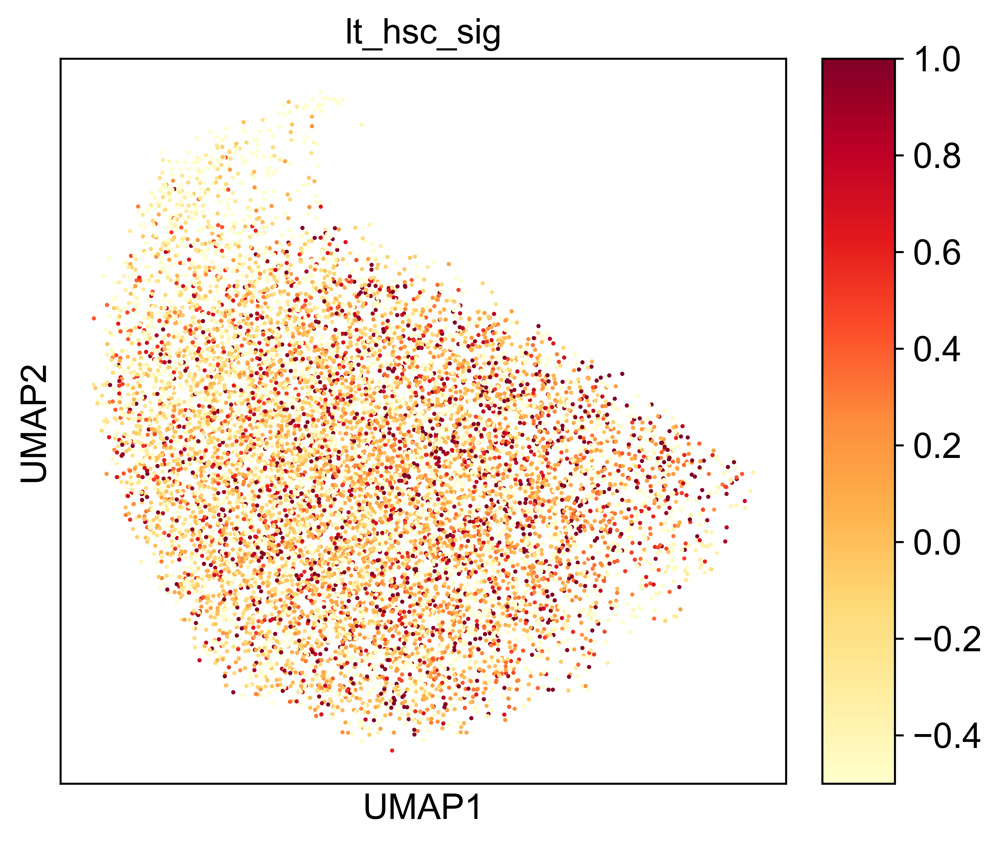

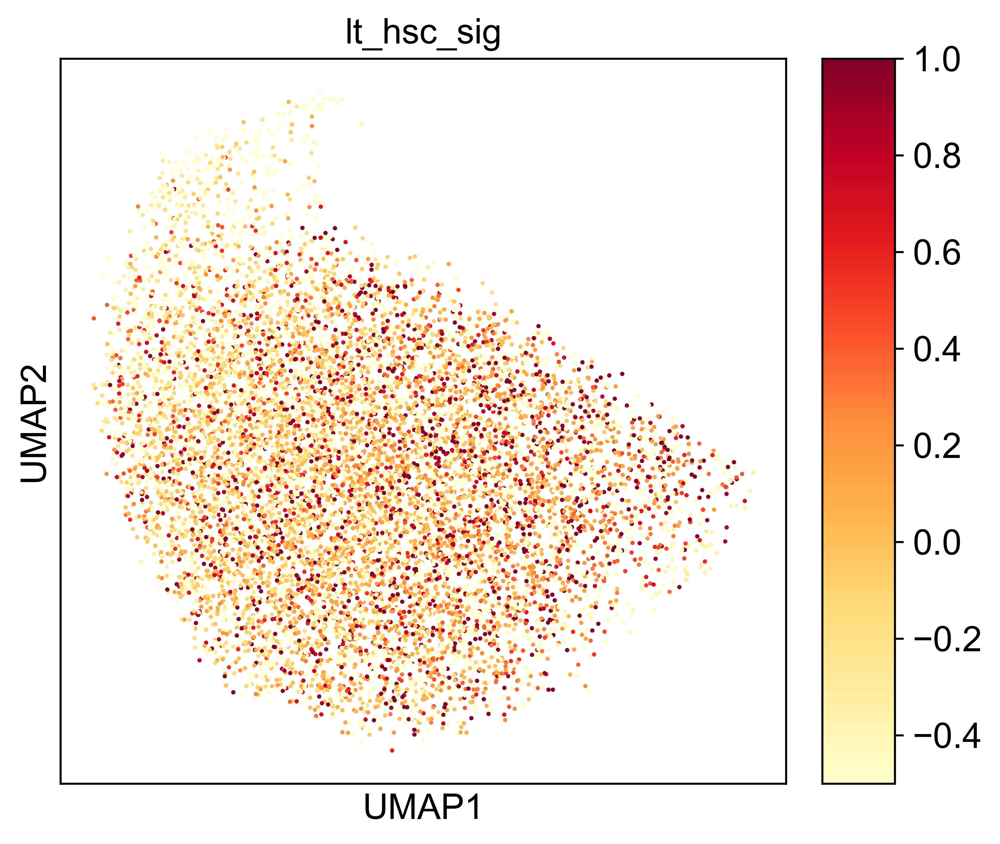

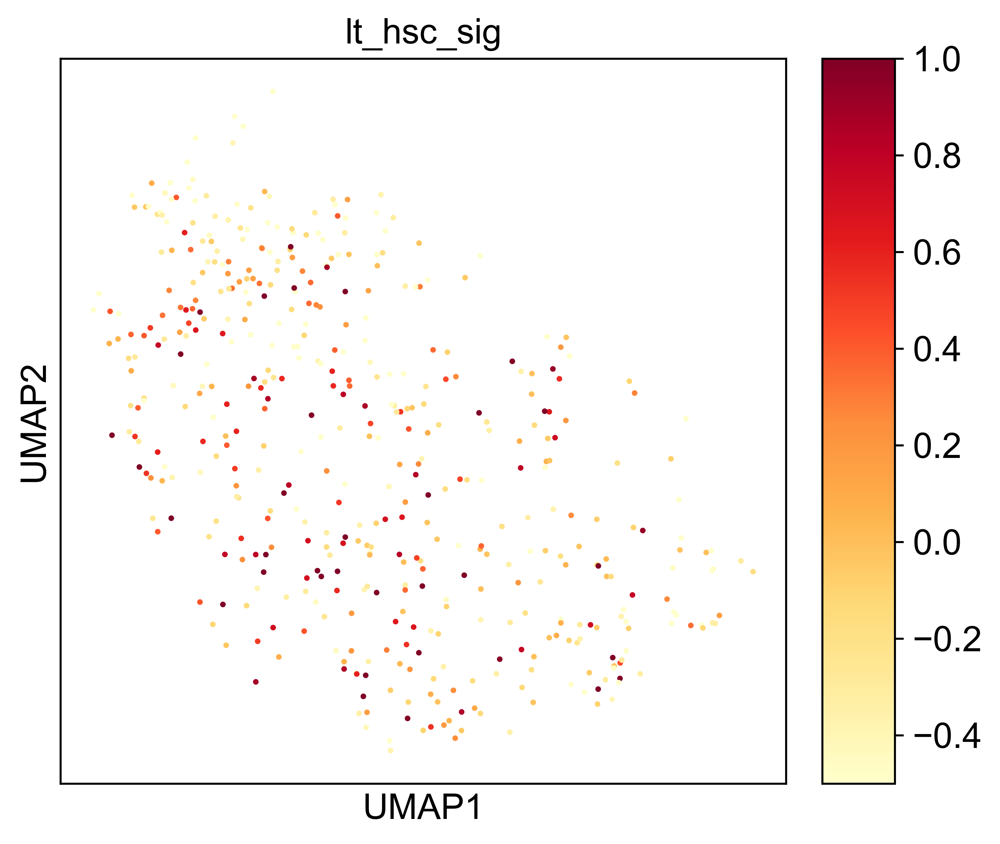

In [136]:
pg.scatter(data,"lt_hsc_sig" ,cmaps='YlOrRd', vmin=-0.5, vmax=1 ,alpha=1)
pg.scatter(data_10x,"lt_hsc_sig" ,cmaps='YlOrRd', vmin=-0.5, vmax=1 ,alpha=1)
pg.scatter(data_ss2,"lt_hsc_sig" ,cmaps='YlOrRd', vmin=-0.5, vmax=1 ,alpha=1)


In [138]:
pg.write_output(data,'210318_10x_ss2_gt_harmony_adata_umap.h5ad')

... storing 'sample_type' as categorical
... storing 'Group' as categorical


2021-03-18 09:22:17,204 - pegasusio.readwrite - INFO - h5ad file '210318_10x_ss2_gt_harmony_adata_umap.h5ad' is written.
2021-03-18 09:22:17,205 - pegasusio.readwrite - INFO - Function 'write_output' finished in 59.95s.


In [141]:
pg.write_output(data_ss2,'210318_ss2_gt_harmony_adata_umap.h5ad')

... storing 'sample_type' as categorical
... storing 'genotype' as categorical
... storing 'Group' as categorical


2021-03-18 09:32:52,706 - pegasusio.readwrite - INFO - h5ad file '210318_ss2_gt_harmony_adata_umap.h5ad' is written.
2021-03-18 09:32:52,707 - pegasusio.readwrite - INFO - Function 'write_output' finished in 2.66s.


In [142]:
pg.write_output(data_10x,'210318_10x_gt_harmony_adata_umap.h5ad')

... storing 'sample_type' as categorical
... storing 'genotype' as categorical
... storing 'Group' as categorical


2021-03-18 09:33:38,399 - pegasusio.readwrite - INFO - h5ad file '210318_10x_gt_harmony_adata_umap.h5ad' is written.
2021-03-18 09:33:38,400 - pegasusio.readwrite - INFO - Function 'write_output' finished in 45.69s.
